In [2]:
from distutils.dir_util import copy_tree
import os
import os.path
import tqdm

import zipfile
import os, os.path
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import io
from pathlib import Path
import time
import copy

# import pytorch
import torch
from torch import nn
from torch.nn import Parameter
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable
from torch.utils.data import DataLoader
import torchvision
from torchvision import transforms, datasets, models

In [111]:
class AttrDict(dict):
    def __init__(self, *args, **kwargs):
        super(AttrDict, self).__init__(*args, **kwargs)
        self.__dict__ = self


def print_opts(opts):
    """
    Print all the parameters in opts before training starts.
    """
    print('=' * 79)
    print('Opts'.center(79))
    print('-' * 79)
    for key in opts.__dict__:
        if opts.__dict__[key]:
            print('{:>30}: {:<30}'.format(key, opts.__dict__[key]).center(79))
    print('=' * 79)

def get_image_dataset(opts):
    data_transforms = {
        'train': transforms.Compose([
            transforms.Resize(opts.image_size),
            transforms.CenterCrop(opts.crop_size),
            # transforms.RandomHorizontalFlip(p=opts.flip_prob),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        'test': transforms.Compose([
            transforms.Resize(opts.image_size),
            transforms.CenterCrop(opts.crop_size),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
    }
    
    dataset_path = "dataset/"
    image_datasets = {category: datasets.ImageFolder(os.path.join(dataset_path, category),
                                                     data_transforms[category])
                      for category in ['train', 'test']}
    return image_datasets

def get_anime_loader(opts):
    """
    Retunrs a dictionary containing two key-value pairs:
        'train': training dataloader
        'test': validation dataloader
    """
    data_transforms = {
        'train': transforms.Compose([
            transforms.Resize(opts.image_size),
            transforms.CenterCrop(opts.crop_size),
            # transforms.RandomHorizontalFlip(p=opts.flip_prob),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        'test': transforms.Compose([
            transforms.Resize(opts.image_size),
            transforms.CenterCrop(opts.crop_size),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
    }
    
    dataset_path = "dataset/"
    image_datasets = {category: datasets.ImageFolder(os.path.join(dataset_path, category),
                                                     data_transforms[category])
                      for category in ['train', 'test']}
    
    dataloader_dict = {category: torch.utils.data.DataLoader(image_datasets[category],
                                                         batch_size=opts.batch_size,
                                                         shuffle=True,
                                                         num_workers=opts.num_workers)
                   for category in ['train', 'test']}
    
    dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'test']}
    print(f"dataset_sizes = {dataset_sizes}")
    print(f"Total number of images = {dataset_sizes['train'] + dataset_sizes['test']}")
    # class_names = image_datasets['train'].classes
    # print(f"class_name 0 = {class_names[0]}")
    
    return dataloader_dict

In [112]:
def transform_img(img_class, img_name, opts):
    """
    Transform a given image into Tensor.
    """
    transform_func = transforms.Compose([
        transforms.Resize(opts.image_size),
        transforms.CenterCrop(opts.crop_size),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    root_path = 'dataset/train'
    img_pil = Image.open(os.path.join(root_path, str(img_class), str(img_name) + ".jpg"))
    return transform_func(img_pil)

## Visualize GoogLeNet Feature Maps

In [174]:
googlenet_layers_str = ['Conv2d_1a_3x3',
                        'Conv2d_2a_3x3',
                        'Conv2d_2b_3x3',
                        'Conv2d_3b_1x1',
                        'Conv2d_4a_3x3',
                        'Mixed_5b',
                        'Mixed_5c',
                        'Mixed_5d',
                        #'Mixed_6a',
                        #'Mixed_6b',
                        #'Mixed_6c',
                        #'Mixed_6d',
                        #'Mixed_6e',
                        #'Mixed_7a',
                        #'Mixed_7b',
                        #'Mixed_7c'
                       ]

                                      Opts                                     
-------------------------------------------------------------------------------
                             image_size: 299                                   
                              crop_size: 299                                   
Visualizing GoogLeNet Conv2d_1a_3x3...
Visualizing GoogLeNet Conv2d_2a_3x3...
Visualizing GoogLeNet Conv2d_2b_3x3...
Visualizing GoogLeNet Conv2d_3b_1x1...
Visualizing GoogLeNet Conv2d_4a_3x3...
Visualizing GoogLeNet Mixed_5b...
Visualizing GoogLeNet Mixed_5c...
Visualizing GoogLeNet Mixed_5d...
done!


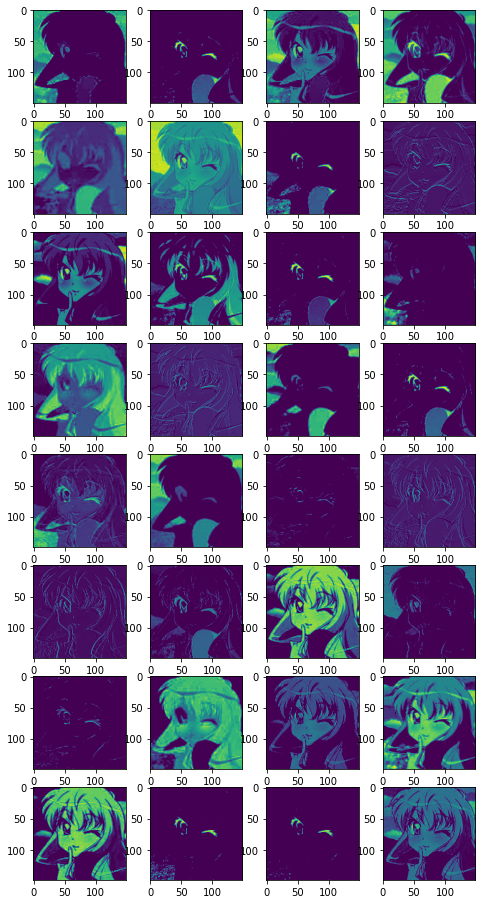

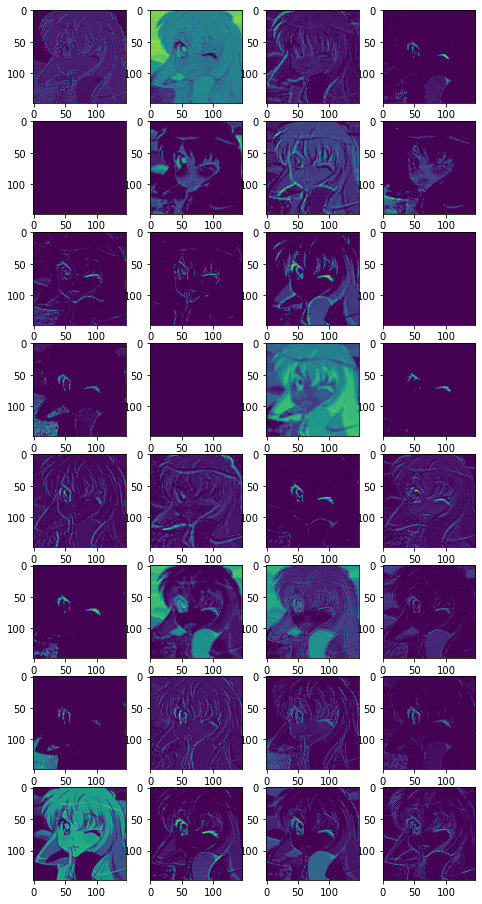

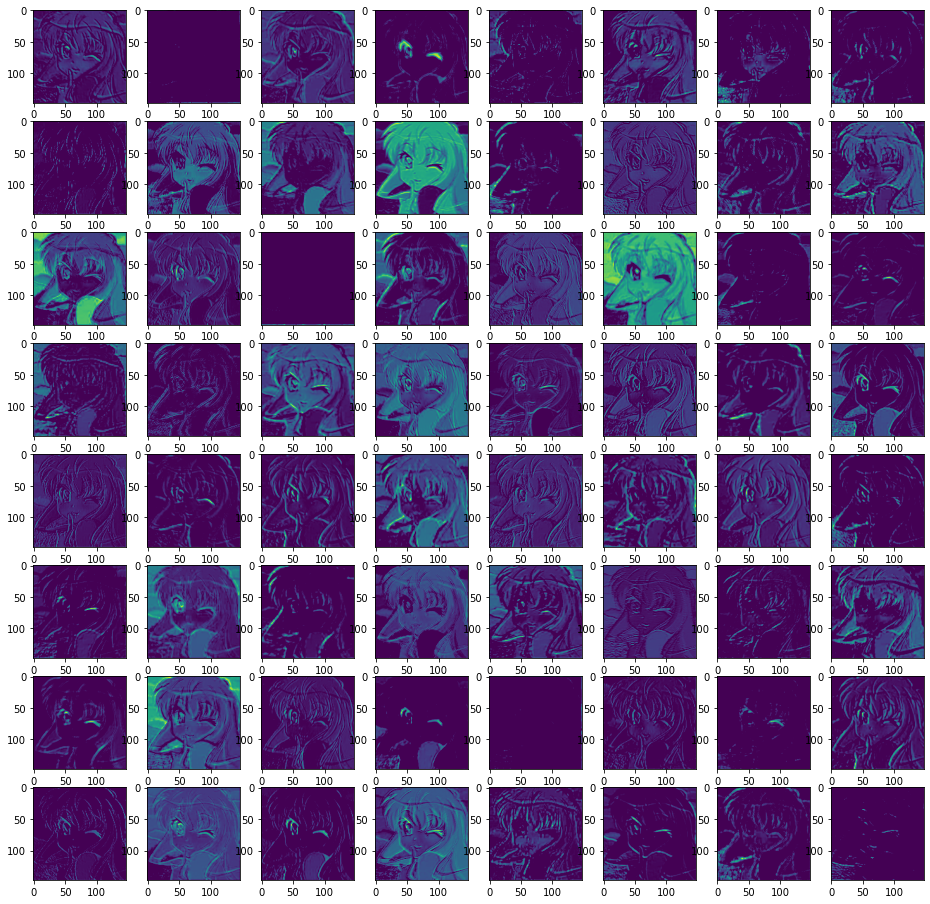

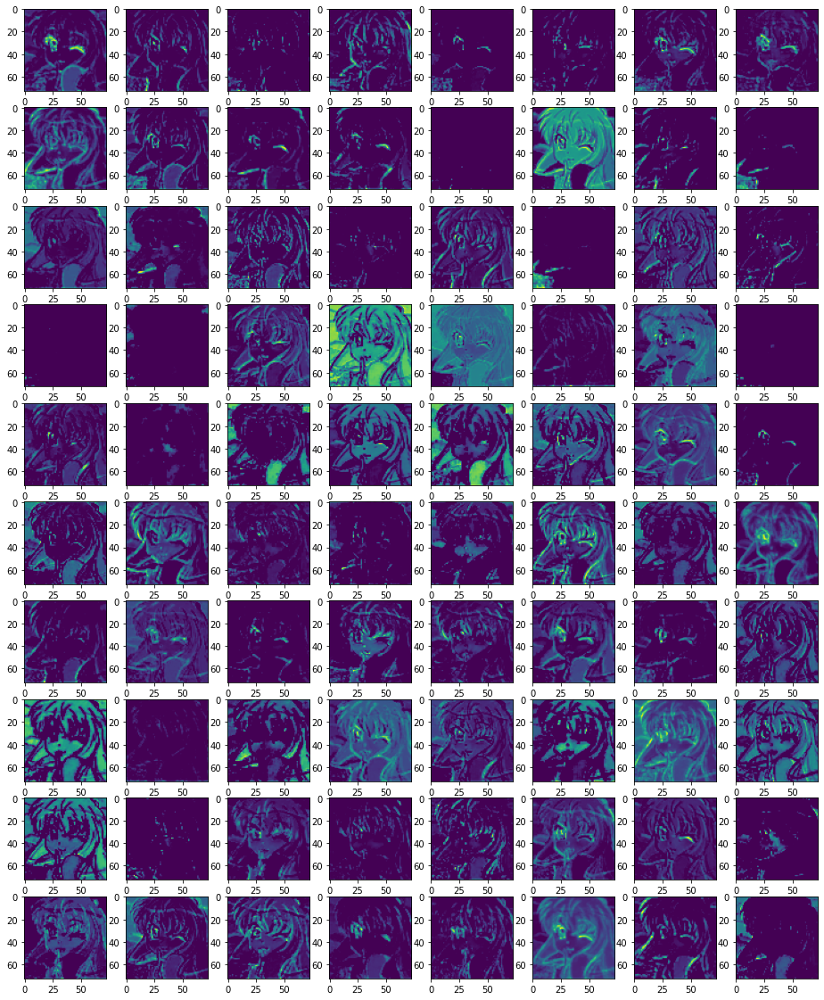

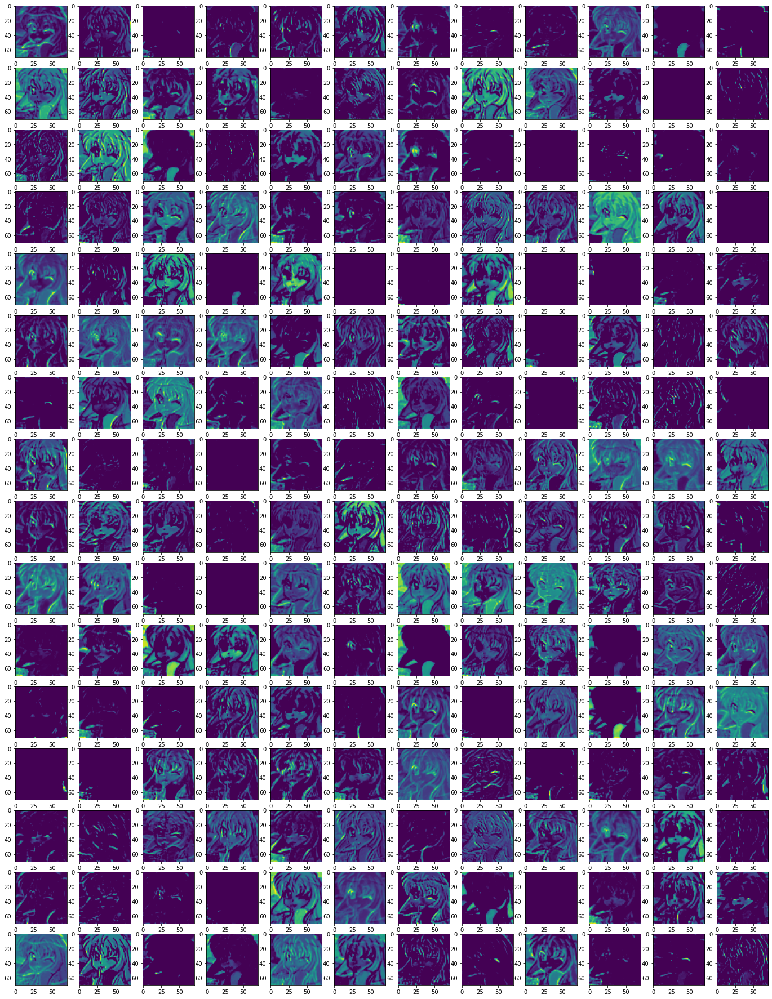

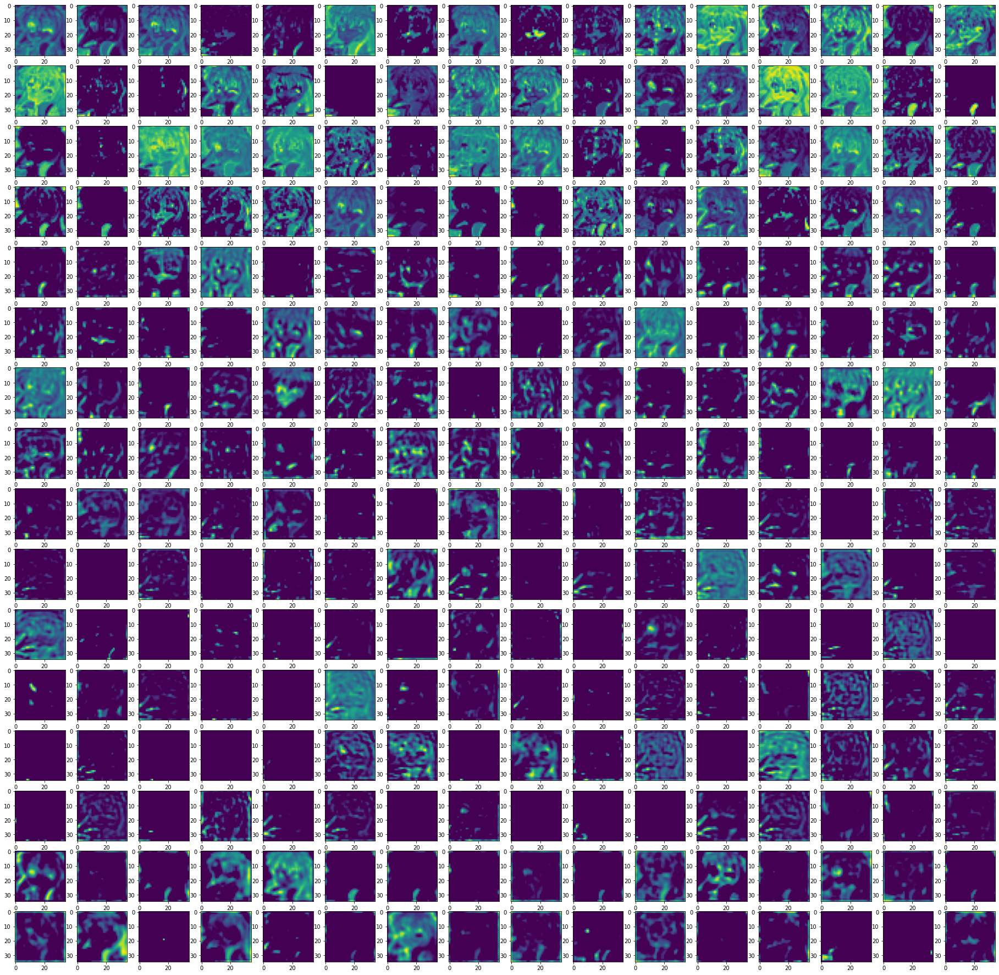

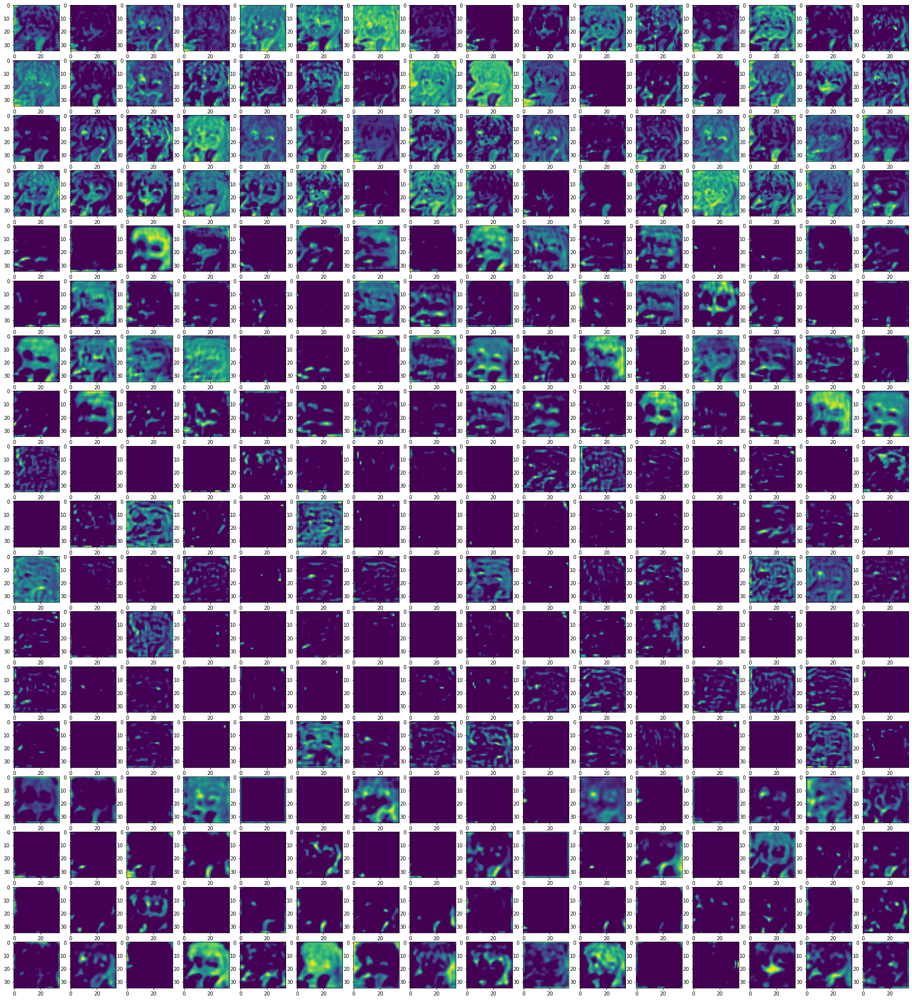

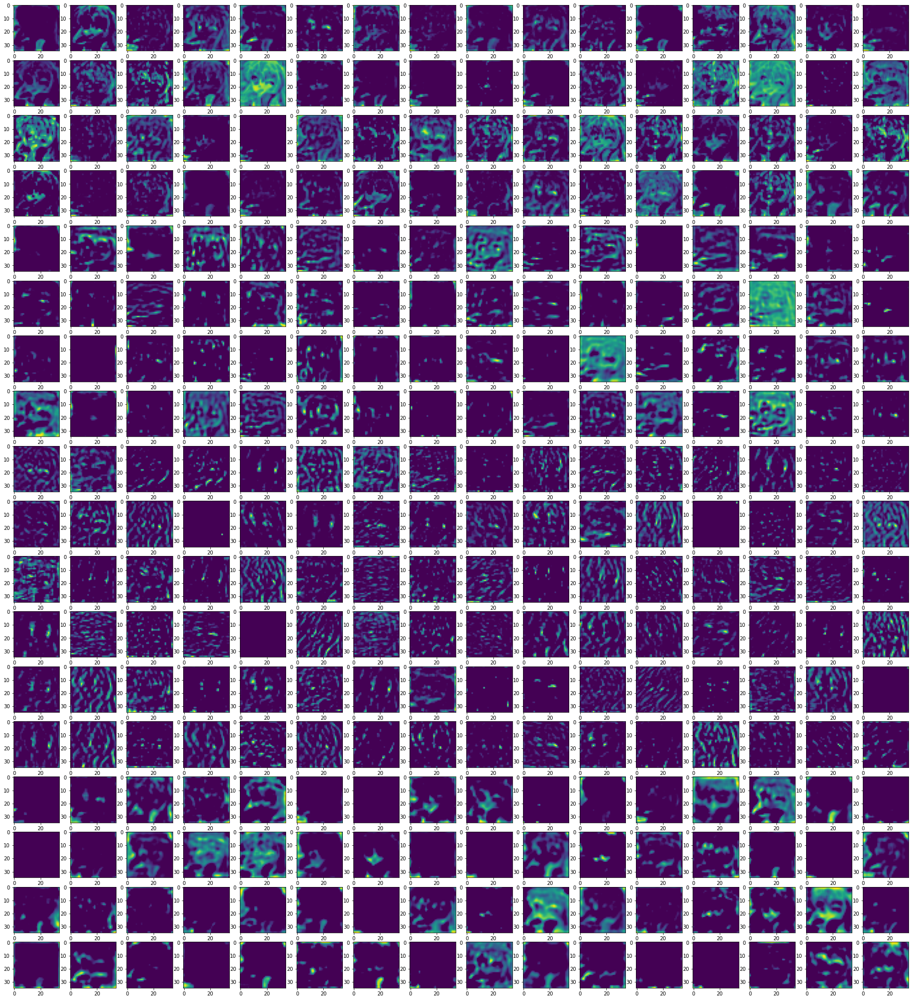

In [180]:
googlenet_model = models.inception_v3()
googlenet_model_weights = torch.load("model_weights/googlenet_scratch_weights.pth")
googlenet_model.load_state_dict(googlenet_model_weights)
googlenet_model.eval()
    
googlenet_activation = {}
def get_activation(name):
    def hook(model, input, output):
        googlenet_activation[name] = output.detach()
    return hook

googlenet_layers = [googlenet_model.Conv2d_1a_3x3,
                    googlenet_model.Conv2d_2a_3x3,
                    googlenet_model.Conv2d_2b_3x3,
                    googlenet_model.Conv2d_3b_1x1,
                    googlenet_model.Conv2d_4a_3x3,
                    googlenet_model.Mixed_5b,
                    googlenet_model.Mixed_5c,
                    googlenet_model.Mixed_5d,
                    #googlenet_model.Mixed_6a,
                    #googlenet_model.Mixed_6b,
                    #googlenet_model.Mixed_6c,
                    #googlenet_model.Mixed_6d,
                    #googlenet_model.Mixed_6e,
                    #googlenet_model.Mixed_7a,
                    #googlenet_model.Mixed_7b,
                    #googlenet_model.Mixed_7c
                   ]

for i in range(len(googlenet_layers_str)):
    googlenet_layers[i].register_forward_hook(get_activation(googlenet_layers_str[i]))
    

args = AttrDict()
args_dict = {
    'image_size': 299,
    'crop_size': 299,
}
args.update(args_dict)
print_opts(args)

img_class = 65
img_name = 18
input = transform_img(img_class, img_name, args)
input.unsqueeze_(0)
output = googlenet_model(input)

for layer_name in googlenet_activation:
    print(f"Visualizing GoogLeNet {layer_name}...")
    act = googlenet_activation[layer_name].squeeze()
    # plot_width = len(act) // 4
    subplot_height, subplot_width = int(len(act) ** 0.5), int(len(act) ** 0.5)
    if len(act) == 32:
        subplot_height, subplot_width = 8, 4
    elif len(act) == 80:
        subplot_height, subplot_width = 10, 8
    elif len(act) == 192:
        subplot_height, subplot_width = 16, 12
    elif len(act) == 288:
        subplot_height, subplot_width = 18, 16
    plot_width, plot_height = subplot_width * 2, subplot_height * 2
    fig = plt.figure(figsize=(plot_width, plot_height))
    for i in range(1, len(act) + 1):
        fig.add_subplot(subplot_height, subplot_width, i)
        plt.imshow(act[i - 1])
    plt.savefig(f"visualization/feature_maps/googlenet/scratch_img_{img_class}_{img_name}_googlenet_{layer_name}.jpg")
print("done!")

## Visualize ResNet Feature Maps

In [209]:
resnet_layers_str = ['conv1',
                     'layer1',
                     'layer2',
                     #'layer3',
                     #'layer4'
                    ]

                                      Opts                                     
-------------------------------------------------------------------------------
                             image_size: 256                                   
                              crop_size: 224                                   
Visualizing ResNet conv1...
Visualizing ResNet layer1...
Visualizing ResNet layer2...
done!


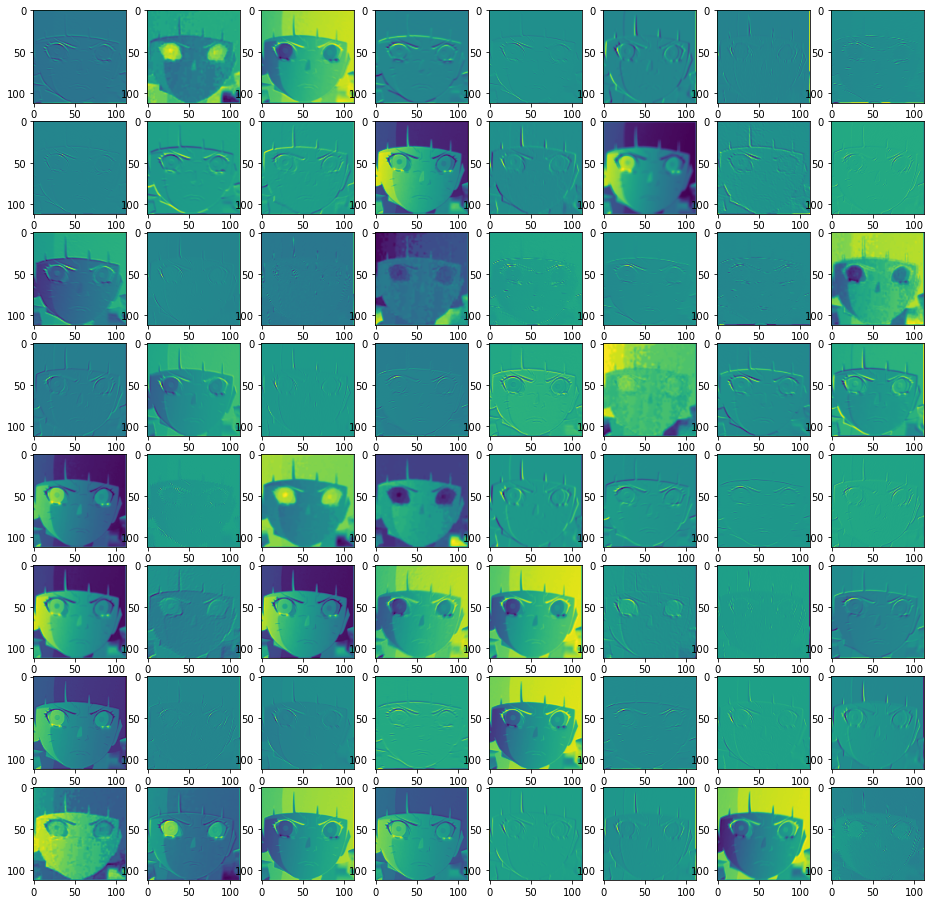

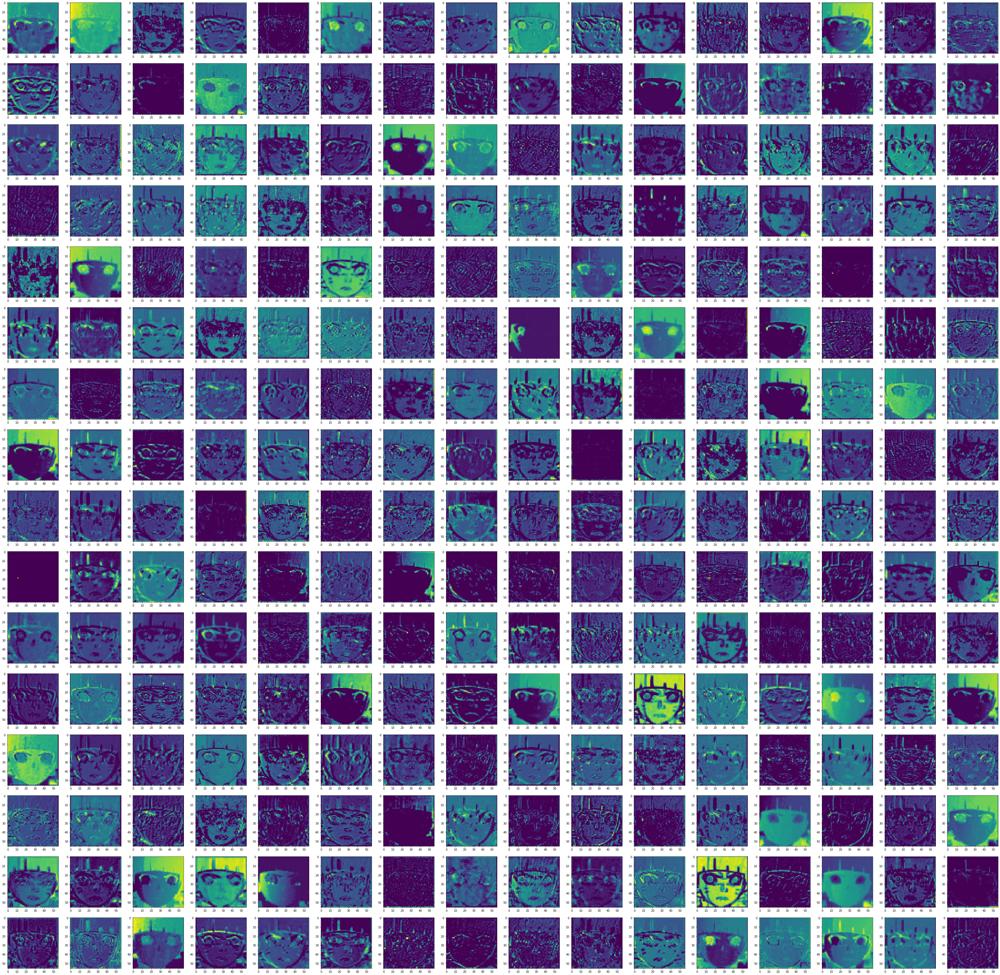

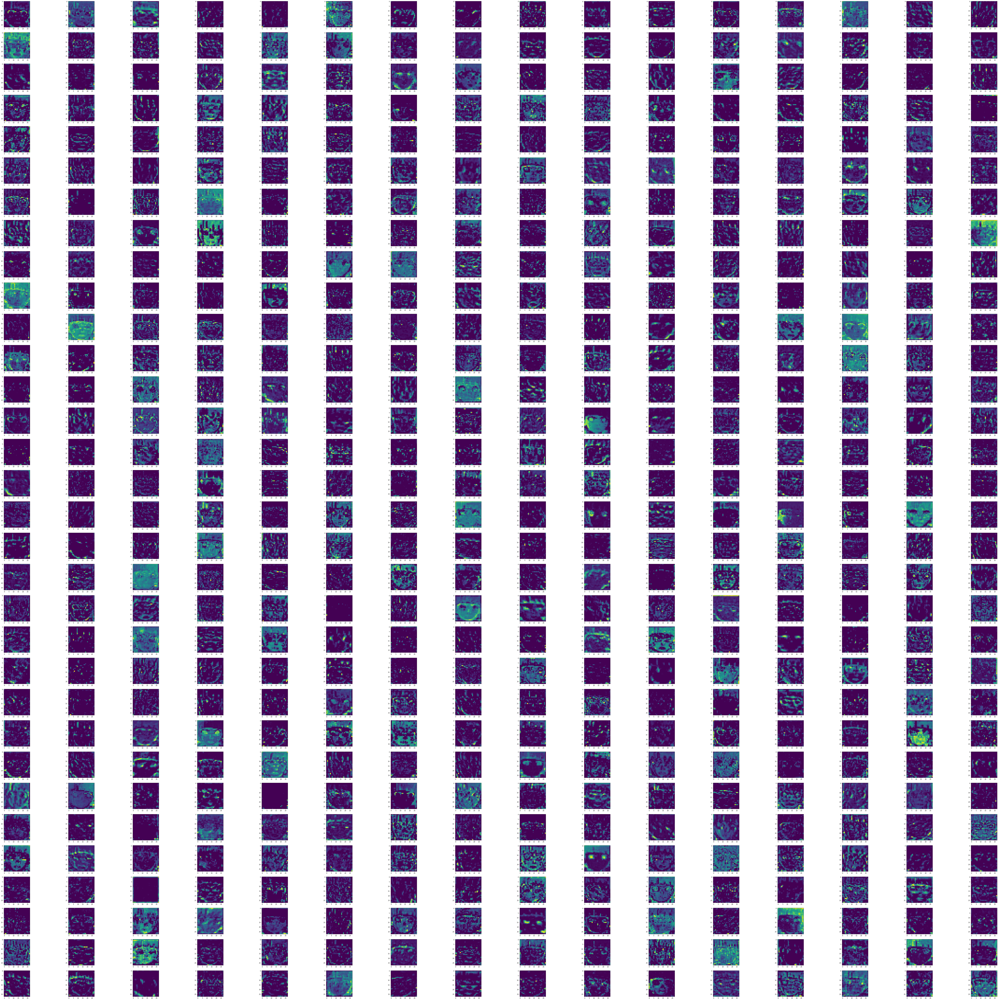

In [211]:
# r_epoch = 3
resnet_model = models.resnet50()
resnet_model_weights = torch.load(f"model_weights/resnet_pretrained_weights.pth")
resnet_model.load_state_dict(resnet_model_weights)
resnet_model.eval()

resnet_layers = [resnet_model.conv1,
                 resnet_model.layer1,
                 resnet_model.layer2,
                 #resnet_model.layer3,
                 #resnet_model.layer4
                ]

resnet_activation = {}
def get_activation(name):
    def hook(model, input, output):
        resnet_activation[name] = output.detach()
    return hook

for i in range(len(resnet_layers_str)):
    resnet_layers[i].register_forward_hook(get_activation(resnet_layers_str[i]))

args = AttrDict()
args_dict = {
    'image_size': 256,
    'crop_size': 224,
}
args.update(args_dict)
print_opts(args)

img_class = 753
img_name = 47
input = transform_img(img_class, img_name, args)
input.unsqueeze_(0)
output = resnet_model(input)

for layer_name in resnet_activation:
    print(f"Visualizing ResNet {layer_name}...")
    act = resnet_activation[layer_name].squeeze()
    plot_width = len(act) // 4
    subplot_height, subplot_width = int(len(act) ** 0.5), int(len(act) ** 0.5)
    if len(act) == 512:
        subplot_height, subplot_width = 32, 16
    fig = plt.figure(figsize=(plot_width, plot_width))
    for i in range(1, len(act) + 1):
        fig.add_subplot(subplot_height, subplot_width, i)
        plt.imshow(act[i - 1])
    plt.savefig(f"visualization/feature_maps/resnet/img_{img_class}_{img_name}_resnet_fm_{layer_name}.jpg")
print("done!")

In [213]:
model = models.inception_v3()
model

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

## Grad-CAM (Visualize Heat Map)

In [102]:
def transform_img_diff_normalization(img_class, img_name, opts):
    """
    Given image class and image name, return a tuple ("img_class_img_name", image itself, tensor of the image)
    """
    transform_func = transforms.Compose([
        transforms.Resize(opts.image_size),
        transforms.CenterCrop(opts.crop_size),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ])
    root_path = 'dataset/train'
    img_pil = Image.open(os.path.join(root_path, str(img_class), str(img_name) + ".jpg"))
    return transform_func(img_pil)

In [202]:
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image, preprocess_image
from torchvision.models import resnet50
from matplotlib.image import imread
import matplotlib.pyplot as plt

def grad_cam_heat_map(img_class, img_name, model_name, pretrained=True):
    if model_name.lower() == "googlenet":
        model = models.inception_v3(pretrained=pretrained)
        if pretrained:
            model_weights = torch.load("model_weights/googlenet_pretrained_weights.pth")
        else:
            model_weights = torch.load("model_weights/googlenet_scratch_weights.pth")
        model.load_state_dict(model_weights)
        model = model.to(device)
        layers = [model.Conv2d_1a_3x3,
                  model.Conv2d_2a_3x3,
                  model.Conv2d_2b_3x3,
                  model.Conv2d_3b_1x1,
                  model.Conv2d_4a_3x3,
                  model.Mixed_5b,
                  model.Mixed_5c,
                  model.Mixed_5d,
                  model.Mixed_6a,
                  model.Mixed_6b,
                  model.Mixed_6c,
                  model.Mixed_6d,
                  #model.Mixed_6e,
                  #model.Mixed_7a,
                  #model.Mixed_7b,
                  #model.Mixed_7c
                 ]
    else:
        model = models.resnet50(pretrained=pretrained)
        if pretrained:
            model_weights = torch.load("model_weights/resnet_pretrained_weights.pth")
        else:
            model_weights = torch.load("model_weights/resnet_scratch_weights.pth")
        model.load_state_dict(model_weights)
        model = model.to(device)
        layers = [model.conv1,
                  model.layer1,
                  model.layer2,
                  model.layer3,
                  model.layer4,
                  #model.layer4[-1]
                 ]
    for i, target_layers in enumerate(layers):
        target_layers = [target_layers]
        input_tensor = transform_img(img_class, img_name, args)
        input_tensor = input_tensor.to(device)
        input_tensor = input_tensor.unsqueeze_(0)
        # input_tensor = # Create an input tensor image for your model..
        # Note: input_tensor can be a batch tensor with several images!

        # Construct the CAM object once, and then re-use it on many images:
        cam = GradCAM(model=model, target_layers=target_layers, use_cuda=True)

        targets = None

        # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets, aug_smooth=True)

        # In this example grayscale_cam has only one image in the batch:
        grayscale_cam = grayscale_cam[0, :]
        rgb_img = transform_img_no_normalization(img_class, img_name, args)
        rgb_img = rgb_img.permute(1, 2, 0)
        rgb_img = np.float32(rgb_img.cpu().clone().numpy())
        visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
        plt.imshow(visualization)
        tag = "pretrained"
        if not pretrained:
            tag = "scratch"
        plt.savefig(os.path.join("visualization/heatmap",
                                 "_".join([str(img_class), str(img_name), model_name, tag, "layer" + str(i)]) + ".jpg"))

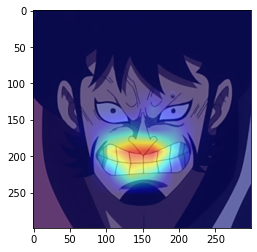

In [208]:
grad_cam_heat_map(81, 3, "resnet", pretrained=False)